In [1]:
import numpy as np
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from pathlib import Path
import multiprocessing
from scipy.spatial.distance import cdist
import yaml
from datetime import datetime
import pathlib
import math
import numpy as np
from cv2 import Rodrigues
from math import sin, cos, atan2, sqrt
import pandas as pd
from pathlib import Path
import pyproj
from pyproj import Proj, transform

In [2]:
def init_logger(log_file='logger.log'):
    from logging import getLogger, INFO, FileHandler,  Formatter,  StreamHandler
    logger = getLogger(__name__)
    logger.setLevel(INFO)
    handler1 = StreamHandler()
    handler1.setFormatter(Formatter("%(message)s"))
    handler2 = FileHandler(filename=log_file)
    handler2.setFormatter(Formatter("%(message)s"))
    logger.addHandler(handler1)
    logger.addHandler(handler2)
    return logger
    
today = datetime.now().strftime('%Y-%m-%d')
logger = init_logger(log_file=f'./{today}.log')
logger.info('Start Logging...')

Start Logging...


In [3]:
def seed_everything(seed: int):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)

In [4]:
# config
with open('config.yaml') as f:
    config = yaml.safe_load(f)

# globals variable
SEED = config['globals']['seed']
N_SPLITS = config['globals']['n_splits']
USE_FOLDS = config['globals']['use_folds']
DEBUG = config['globals']['debug']
EXP_MESSAGE = config['globals']['exp_message']
NOTES = config['globals']['notes']
EXP_NAME = str(Path().resolve()).split('/')[-1]

In [5]:
import pickle
def to_pickle(filename, obj):
    with open(filename, mode='wb') as f:
        pickle.dump(obj, f)
        
def from_pickle(filename):
    with open(filename, mode='rb') as f:
        obj = pickle.load(f)
    return obj

In [6]:
# waypointを補正したdataset
root_dir = Path('../../input')
data_dir = root_dir/'google-smartphone-decimeter-challenge'
collection_type_dict = from_pickle(root_dir/"road_type.pkl") # by edge'sdegree and highway feature
collection_type_dict["test"]['2021-03-25-US-PAO-1'] = "normal"

In [7]:
def get_ground_truth(args):
    (collectionName, phoneName), df = args
    
    path = root_dir / f"train/{collectionName}/{phoneName}/ground_truth.csv"
    target_df = pd.read_csv(path)
    output_df = pd.DataFrame()
    # merge derived and target by 'millisSinceGpsEpoch'
    for epoch, epoch_df in df.groupby('millisSinceGpsEpoch'):
        idx = (target_df['millisSinceGpsEpoch'] - epoch).abs().argmin()
        # epoch_diff = epoch - target_df.loc[idx, 'millisSinceGpsEpoch']
        # epoch_df['epoch_diff'] = epoch_diff
        epoch_df['target_latDeg'] = target_df.loc[idx, 'latDeg']
        epoch_df['target_lngDeg'] = target_df.loc[idx, 'lngDeg']
        # epoch_df['speedMps'] = target_df.loc[idx, 'speedMps']
        output_df = pd.concat([output_df, epoch_df]).reset_index(drop=True)    
    return output_df

In [8]:
# metric
def calc_haversine(lat1, lon1, lat2, lon2):
    """Calculates the great circle distance between two points
    on the earth. Inputs are array-like and specified in decimal degrees.
    """
    RADIUS = 6_367_000
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    dist = 2 * RADIUS * np.arcsin(a**0.5)
    return dist

def check_score(input_df: pd.DataFrame) -> pd.DataFrame:
    if "phone" not in input_df.columns:
        input_df["phone"] = input_df["collectionName"] + "_" + input_df["phoneName"]

    if "target_latDeg" not in input_df.columns:
        processes = multiprocessing.cpu_count()
        with multiprocessing.Pool(processes=processes) as pool:
            gr = input_df.groupby(['collectionName','phoneName'])
            dfs = pool.imap_unordered(get_ground_truth, gr)
            dfs = tqdm(dfs, total=len(gr))
            dfs = list(dfs)
        input_df = pd.concat(dfs).sort_values(['collectionName', 'phoneName', 'millisSinceGpsEpoch']).reset_index(drop=True)     


    output_df = input_df.copy()
    
    output_df['error'] = input_df.apply(
        lambda r: calc_haversine(
            r.latDeg, r.lngDeg, r.target_latDeg, r.target_lngDeg
        ),
        axis=1
    )

    meter_score = output_df['error'].mean()
    logger.info(f'mean error: {meter_score}')

    scores = []
    p_50_scores = []
    p_95_scores = []
    mean_scores = []
    phones = []
    score_df = pd.DataFrame()
    for phone in output_df['phone'].unique():
        _index = output_df['phone']==phone
        p_50 = np.percentile(output_df.loc[_index, 'error'], 50)
        p_95 = np.percentile(output_df.loc[_index, 'error'], 95)
        # print(f"{phone} | 50:{p_50:.5g}| 95:{p_95:.5g}")
        p_50_scores.append(p_50)
        p_95_scores.append(p_95)
        mean_scores.append(np.mean([p_50, p_95]))
        phones.append(phone)

        scores.append(p_50)
        scores.append(p_95)

    score_df["phone"] = phones
    score_df["p_50_score"] = p_50_scores
    score_df["p_95_score"] = p_95_scores
    score_df["mean_score"] = mean_scores
    
    comp_score = sum(scores) / len(scores)
    logger.info(f"competition metric:{comp_score}")
    return output_df, score_df

In [9]:
def check_time(_df):
    data = _df.copy().reset_index(drop=True)
    data['ms_dif'] = data['millisSinceGpsEpoch']-data['millisSinceGpsEpoch'].shift()
    mis_time = (len(data)-1-data['ms_dif'].value_counts()[1000.0])/len(data)
    return mis_time>0.0

def adjust_time(df, kf):
    data = df.copy().reset_index(drop=True)
    new_data = data.copy()
    t = 'millisSinceGpsEpoch'
    start = data['millisSinceGpsEpoch'].values[0]
    end = data['millisSinceGpsEpoch'].values[-1]
    ind = math.ceil((end-start)/1000)
    _data = pd.DataFrame(index=range(ind))
    _data['latDeg']=0
    _data['lngDeg']=0
    #_data['millisSinceGpsEpoch'] = 0
    _data['millisSinceGpsEpoch'] = start+1000*_data.index
    
    cnt = 0
    for i in _data.index:
        while _data.loc[i,t]<new_data.loc[cnt,t] or _data.loc[i,t]>new_data.loc[cnt+1,t]:
            cnt+=1
        if _data.loc[i,t]==new_data.loc[cnt,t]:
            _data.loc[i,'latDeg'] = new_data.loc[cnt,'latDeg']
            _data.loc[i,'lngDeg'] = new_data.loc[cnt,'lngDeg']
        else:
            w=(new_data.loc[cnt+1,t]-_data.loc[i,t])/(new_data.loc[cnt+1,t]-new_data.loc[cnt,t])
            if w<0 or w>1:
                print(w)
            _data.loc[i,'latDeg'] = new_data.loc[cnt,'latDeg']*w+new_data.loc[cnt+1,'latDeg']*(1-w)
            _data.loc[i,'lngDeg'] = new_data.loc[cnt,'lngDeg']*w+new_data.loc[cnt+1,'lngDeg']*(1-w)
    _data.head()
    __data = _data.loc[:,['latDeg', 'lngDeg']].to_numpy()
    __data = __data.reshape(1, len(__data), 2)
    smoothed = kf.smooth(__data)
    _data.loc[:,'latDeg_pred'] = smoothed.states.mean[0, :, 0]
    _data.loc[:,'lngDeg_pred'] = smoothed.states.mean[0, :, 1]
    _data.loc[:,'latDeg_cov_pred'] = smoothed.states.cov[0, :, 0,0]
    _data.loc[:,'lngDeg_cov_pred'] = smoothed.states.cov[0, :, 1,1]
    data['latDeg_cov'] = 1
    data['lngDeg_cov'] = 1

    cnt = 0
    for i in data.index:
        try:
            while data.loc[i,t]<_data.loc[cnt,t] or data.loc[i,t]>_data.loc[cnt+1,t]:
                cnt+=1
            if data.loc[i,t]==_data.loc[cnt,t]:
                data.loc[i,'latDeg'] = _data.loc[cnt,'latDeg_pred']
                data.loc[i,'lngDeg'] = _data.loc[cnt,'lngDeg_pred']
                data.loc[i,'latDeg_cov'] = _data.loc[cnt,'latDeg_cov_pred']
                data.loc[i,'lngDeg_cov'] = _data.loc[cnt,'lngDeg_cov_pred']
            else:
                w=(_data.loc[cnt+1,t]-data.loc[i,t])/(_data.loc[cnt+1,t]-_data.loc[cnt,t])
                if w<0 or w>1:
                    print(w)
                data.loc[i,'latDeg'] = _data.loc[cnt,'latDeg_pred']*w+_data.loc[cnt+1,'latDeg_pred']*(1-w)
                data.loc[i,'lngDeg'] = _data.loc[cnt,'lngDeg_pred']*w+_data.loc[cnt+1,'lngDeg_pred']*(1-w)
                data.loc[i,'latDeg_cov'] = _data.loc[cnt,'latDeg_cov_pred']*w+_data.loc[cnt+1,'latDeg_cov_pred']*(1-w)
                data.loc[i,'lngDeg_cov'] = _data.loc[cnt,'lngDeg_cov_pred']*w+_data.loc[cnt+1,'lngDeg_cov_pred']*(1-w)
        except:
            pass
    return data

In [10]:
import simdkalman

def apply_kf_smoothing(input_df, phase="train"):
    logger.info('[START] Kalman Smoothing')
    # define kf model
    df_list = []
    for (collection_name,phone_name), df in input_df.groupby(["collectionName", "phoneName"]):
        df = df.sort_values("millisSinceGpsEpoch")
        T = 1.0
        p_noise = 1e-9
        o_noise = 1e-9

        state_transition = np.array([[1, 0, T, 0, 0.5 * T ** 2, 0], [0, 1, 0, T, 0, 0.5 * T ** 2], [0, 0, 1, 0, T, 0],
                                    [0, 0, 0, 1, 0, T], [0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1]])
        process_noise = np.diag([1e-5, 1e-5, 5e-6, 5e-6, 1e-6, 1e-6]) + np.ones((6, 6)) * p_noise
        observation_model = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0]])    
        observation_noise = np.diag([5e-5, 5e-5]) + np.ones((2, 2)) * o_noise

        kf = simdkalman.KalmanFilter(
            state_transition=state_transition,
            process_noise=process_noise,
            observation_model=observation_model,
            observation_noise=observation_noise)

        if check_time(df):
            _df = adjust_time(df, kf)
            df['latDeg'] = _df['latDeg'].values
            df['lngDeg'] = _df['lngDeg'].values
            df['latDeg_cov'] = _df['latDeg_cov'].values
            df['lngDeg_cov'] = _df['lngDeg_cov'].values
        else:
            data = df[['latDeg', 'lngDeg']].to_numpy()
            data = data.reshape(1, len(data), 2)
            smoothed = kf.smooth(data)
            df['latDeg'] = smoothed.states.mean[0, :, 0]
            df['latDeg_cov'] = smoothed.states.cov[0, :, 0,0]
            df['lngDeg'] = smoothed.states.mean[0, :, 1]
            df['lngDeg_cov'] = smoothed.states.cov[0, :, 1,1]
        df_list.append(df)
    output_df = pd.concat(df_list).reset_index(drop=True) # .sort_index()
    return output_df

In [11]:
# https://www.kaggle.com/dehokanta/baseline-post-processing-by-outlier-correction
def outlier_correction(df):
    logger.info('[START] outlier correction')
    df['dist_pre'] = 0
    df['dist_pro'] = 0
    df['latDeg_pre'] = df['latDeg'].shift(periods=1,fill_value=0)
    df['lngDeg_pre'] = df['lngDeg'].shift(periods=1,fill_value=0)
    df['latDeg_pro'] = df['latDeg'].shift(periods=-1,fill_value=0)
    df['lngDeg_pro'] = df['lngDeg'].shift(periods=-1,fill_value=0)
    df['dist_pre'] = calc_haversine(df["latDeg_pre"], df["lngDeg_pre"], df["latDeg"], df["lngDeg"])
    df['dist_pro'] = calc_haversine(df["latDeg"], df["lngDeg"], df["latDeg_pro"], df["lngDeg_pro"])

    list_phone = df['phone'].unique()
    for phone in list_phone:
        ind_s = df[df['phone'] == phone].index[0]
        ind_e = df[df['phone'] == phone].index[-1]
        df.loc[ind_s,'dist_pre'] = 0
        df.loc[ind_e,'dist_pro'] = 0

    pro_95 = df['dist_pro'].mean() + (df['dist_pro'].std() * 2)
    pre_95 = df['dist_pre'].mean() + (df['dist_pre'].std() * 2)
    ind = df[(df['dist_pro'] > pro_95)&(df['dist_pre'] > pre_95)][['dist_pre','dist_pro']].index

    for i in ind:
        df.loc[i,'latDeg'] = (df.loc[i-1,'latDeg'] + df.loc[i+1,'latDeg'])/2
        df.loc[i,'lngDeg'] = (df.loc[i-1,'lngDeg'] + df.loc[i+1,'lngDeg'])/2
    return df


def linear_interpolation(input_df, speed_thr=45):
    logger.info('[START] linear interpolation')
    dfs = pd.DataFrame()
    use_col = input_df.columns
    for (collectionName, phoneName), df in input_df.groupby(['collectionName', 'phoneName']):

        df['delta'] = calc_haversine(
            df['latDeg'], df['lngDeg'], df['latDeg'].shift(1), df['lngDeg'].shift(1))
        df['time_delta'] = df['millisSinceGpsEpoch'] - \
            df['millisSinceGpsEpoch'].shift(1)
        df['delta'].fillna(0, inplace=True)
        df['time_delta'].fillna(0, inplace=True)
        df['speed'] = df['delta'] / (df['time_delta']/1000)  # m/s
        df['speed'].fillna(0, inplace=True)

        # 一度欠損値にする
        df.loc[speed_thr < df['speed'], ['latDeg', 'lngDeg']] = np.nan
        df['dummy_datetime'] = pd.to_datetime(df['millisSinceGpsEpoch'])
        df = df.set_index('dummy_datetime')

        # 時間に合わせて線形補間
        df = df.interpolate(method='time').reset_index(drop=True)
        dfs = pd.concat([dfs, df]).reset_index(drop=True)
    return dfs[use_col]

In [12]:
def make_lerp_data(df):
    '''
    Generate interpolated lat,lng values for different phone times in the same collection.
    '''
    org_columns = df.columns

    # Generate a combination of time x collection x phone and combine it with the original data (generate records to be interpolated)
    time_list = df[['collectionName', 'millisSinceGpsEpoch']].drop_duplicates()
    phone_list = df[['collectionName', 'phoneName']].drop_duplicates()
    tmp = time_list.merge(phone_list, on='collectionName', how='outer')

    lerp_df = tmp.merge(
        df, on=['collectionName', 'millisSinceGpsEpoch', 'phoneName'], how='left')

    lerp_df['phone'] = lerp_df['collectionName'] + '_' + lerp_df['phoneName']
    lerp_df = lerp_df.sort_values(['phone', 'millisSinceGpsEpoch'])

    # linear interpolation
    lerp_df['latDeg_prev'] = lerp_df['latDeg'].shift(1)
    lerp_df['latDeg_next'] = lerp_df['latDeg'].shift(-1)
    lerp_df['lngDeg_prev'] = lerp_df['lngDeg'].shift(1)
    lerp_df['lngDeg_next'] = lerp_df['lngDeg'].shift(-1)
    lerp_df['phone_prev'] = lerp_df['phone'].shift(1)
    lerp_df['phone_next'] = lerp_df['phone'].shift(-1)
    lerp_df['time_prev'] = lerp_df['millisSinceGpsEpoch'].shift(1)
    lerp_df['time_next'] = lerp_df['millisSinceGpsEpoch'].shift(-1)

    # Leave only records to be interpolated(missing coords data)
    lerp_df = lerp_df[(lerp_df['latDeg'].isnull()) & (lerp_df['phone'] == lerp_df['phone_prev']) & (
        lerp_df['phone'] == lerp_df['phone_next'])].copy()
    # calc lerp
    lerp_df['latDeg'] = lerp_df['latDeg_prev'] + ((lerp_df['latDeg_next'] - lerp_df['latDeg_prev']) * (
        (lerp_df['millisSinceGpsEpoch'] - lerp_df['time_prev']) / (lerp_df['time_next'] - lerp_df['time_prev'])))
    lerp_df['lngDeg'] = lerp_df['lngDeg_prev'] + ((lerp_df['lngDeg_next'] - lerp_df['lngDeg_prev']) * (
        (lerp_df['millisSinceGpsEpoch'] - lerp_df['time_prev']) / (lerp_df['time_next'] - lerp_df['time_prev'])))

    # Leave only the data that has a complete set of previous and next data.
    lerp_df = lerp_df[~lerp_df['latDeg'].isnull()]

    return lerp_df[org_columns]

def calc_mean_pred(df, lerp_df):
    '''
    Make a prediction based on the average of the predictions of phones in the same collection.
    '''
    add_lerp = pd.concat([df, lerp_df])
    mean_pred_result = add_lerp.groupby(['collectionName', 'millisSinceGpsEpoch'])[
        ['latDeg', 'lngDeg']].mean().reset_index()
    mean_pred_df = df.copy()
    mean_pred_df = mean_pred_df.drop(["latDeg", "lngDeg"], axis=1)
    mean_pred_df = mean_pred_df.merge(mean_pred_result[['collectionName', 'millisSinceGpsEpoch', 'latDeg', 'lngDeg']], on=[
                                      'collectionName', 'millisSinceGpsEpoch'], how='left')
    return mean_pred_df

def apply_mean(df):
    logger.info('[START] phone-mean')
    lerp = make_lerp_data(df)
    mean_df = calc_mean_pred(df, lerp)
    return mean_df

In [13]:
def get_removedevice(input_df: pd.DataFrame, device: str) -> pd.DataFrame:
    logger.info('[START] remove device')
    input_df['index'] = input_df.index
    input_df = input_df.sort_values('millisSinceGpsEpoch')
    input_df.index = input_df['millisSinceGpsEpoch'].values

    output_df = pd.DataFrame()
    for _, subdf in input_df.groupby('collectionName'):

        phones = subdf['phoneName'].unique()

        if (len(phones) == 1) or (not device in phones):
            output_df = pd.concat([output_df, subdf])
            continue

        origin_df = subdf.copy()

        _index = subdf['phoneName'] == device
        subdf.loc[_index, 'latDeg'] = np.nan
        subdf.loc[_index, 'lngDeg'] = np.nan
        subdf = subdf.interpolate(method='index', limit_area='inside')

        _index = subdf['latDeg'].isnull()
        subdf.loc[_index, 'latDeg'] = origin_df.loc[_index, 'latDeg'].values
        subdf.loc[_index, 'lngDeg'] = origin_df.loc[_index, 'lngDeg'].values

        output_df = pd.concat([output_df, subdf])

    output_df.index = output_df['index'].values
    output_df = output_df.sort_index()

    del output_df['index']

    return output_df

In [14]:
def make_gt(input_dir):
    p = pathlib.Path(input_dir)
    gt_files = list(p.glob('train/*/*/ground_truth.csv'))
    print('ground_truth.csv count : ', len(gt_files))

    gts = []
    for gt_file in tqdm(gt_files):
        gts.append(pd.read_csv(gt_file))
    ground_truth = pd.concat(gts)
    return ground_truth

In [15]:
# waypointを補正したdataset
root_dir = Path('../../input/google-smartphone-decimeter-challenge')

In [16]:
gt = make_gt(root_dir)
road_points = gt[["lngDeg", "latDeg", "collectionName"]]

ground_truth.csv count :  73


  0%|          | 0/73 [00:00<?, ?it/s]

In [17]:
def snap_to_grid(sub, min_thr, max_thr):
    """
    Snap to grid if within a threshold.
    
    x, y are the predicted points.
    x_, y_ are the closest grid points.
    _x_, _y_ are the new predictions after post processing.
    """
    sub['_latDeg_'] = sub['latDeg']
    sub['_lngDeg_'] = sub['lngDeg']
    sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), '_latDeg_'] = sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), 'matched_latDeg']
    sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), '_lngDeg_'] = sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), 'matched_lngDeg']
    return sub.copy()

from scipy.spatial.distance import cdist

def add_xy(df):
    df['point'] = [(x, y) for x,y in zip(df['lngDeg'], df['latDeg'])]
    return df

def closest_point(point, points):
    """ Find closest point from a list of points. """
    return points[cdist([point], points).argmin()]


def matching_point(target_df, target_road_points=road_points):
    # place = target_df["place"].unique()[0]
    # target_road_points = road_points[road_points["place"]==place]
    target_df['matched_point'] = [closest_point(x, list(target_road_points['point'])) for x in tqdm(target_df['point'])]
    target_df['lngDeg'] = target_df['matched_point'].apply(lambda x: x[0])
    target_df['latDeg'] = target_df['matched_point'].apply(lambda x: x[1])
    return target_df


def apply_snap_to_grid(df, road_points, phase="train"):
    logger.info('[START] Snap to Grid')

    df["place"] = df["collectionName"].str[11:]

    df = add_xy(df)
    road_points = add_xy(road_points)
    df_list = []
    ncpu = multiprocessing.cpu_count()
    for place, target_df in tqdm(df.groupby("place")):
        
        # TODO collectionNameではなく道路密度or typeで分岐
        if ((phase=="train")&(place in ['US-SJC-1', 'US-SJC-2'])) | ((phase=="test")&(place in ['US-SJC-2', 'US-SJC-3'])):
            target_df = target_df.reset_index(drop=True)
            k = round(len(target_df)/ncpu)
            target_dfs = [target_df.loc[i:i+k-1, :] for i in range(0, len(target_df), k)]
            with multiprocessing.Pool(processes=ncpu) as pool:
                dfs = pool.imap_unordered(matching_point, target_dfs)
                dfs = list(tqdm(dfs, total=len(target_dfs)))
                df = pd.concat(dfs)
            df_list.append(df)
        else:
            df_list.append(target_df)

    df = pd.concat(df_list).reset_index(drop=True)
    return df

In [18]:
def epoch_mean(input_df):
    output_df = input_df.copy()
    output_df['sSinceGpsEpoch'] = np.round(output_df['millisSinceGpsEpoch'] / 1000, 1)
    print(output_df['millisSinceGpsEpoch'].nunique(), output_df['sSinceGpsEpoch'].nunique())
    output_df = pd.merge(output_df, output_df.groupby('sSinceGpsEpoch')['latDeg', 'lngDeg'].mean().reset_index().rename(columns={'latDeg':'_latDeg', 'lngDeg':'_lngDeg'}), on='sSinceGpsEpoch', how='left')
    output_df = output_df.drop(['latDeg','lngDeg'], axis=1).rename(columns={'_latDeg':'latDeg', '_lngDeg':'lngDeg'})
    # assert df.columns == use_col
    return output_df

In [19]:
def stop_mean(input_df, max_speed_thr = 0.95, min_second_thr=0, max_second_thr = 2, phase="train"):
    """
    # 予測した速度がmax_speed_thr以下のものがmax_second_thr(s)以上連続する区間を停止区間とみなして平均をとる。
    TODO 道路タイプで適用可否決めたほうがいいかも。都市のところは開始、終了だけにするとか。
    """
    logger.info('[START] stop mean')
    use_col = input_df.columns
    output_df = pd.DataFrame()
    for collection_name, df in input_df.groupby(['collectionName']):

        df = df.sort_values('millisSinceGpsEpoch')
        df['flag'] = df['pred_speedMps'] < max_speed_thr
        df['stop_group'] = (df['flag'] != df['flag'].shift()).cumsum()
        df['num_flaged_data'] = df.groupby('stop_group')['flag'].transform(sum)  # stop group内でのflag(stopしていると判定された)の数
        df.loc[(min_second_thr <= df['num_flaged_data'])&(df['num_flaged_data'] < max_second_thr), 'stop_group'] = 0

        for i in df['stop_group'].unique():
            if i == 0:
                continue

            if collection_type_dict[phase][collection_name]=='city':
                # when start or end
                if (i == 1)or(i == df['stop_group'].unique()[-1]):
                    df.loc[df['stop_group']==i, 'latDeg'] = df.loc[df['stop_group']==i, 'latDeg'].mean()
                    df.loc[df['stop_group']==i, 'lngDeg'] = df.loc[df['stop_group']==i, 'lngDeg'].mean()
            else:
                df.loc[df['stop_group']==i, 'latDeg'] = df.loc[df['stop_group']==i, 'latDeg'].mean()
                df.loc[df['stop_group']==i, 'lngDeg'] = df.loc[df['stop_group']==i, 'lngDeg'].mean()
        
        output_df = pd.concat([output_df, df])
    return output_df[use_col].sort_index()

## データの読み込みと前処理

In [20]:
import warnings
warnings.simplefilter('ignore')

train_df = pd.read_csv(root_dir / "baseline_locations_train_with_speed.csv")
original_train_col = list(train_df.columns)

test_df = pd.read_csv(root_dir / "baseline_locations_test_with_speed.csv")
original_test_col = list(test_df.columns)

sub_df = pd.read_csv(root_dir / 'sample_submission.csv')


In [21]:
train_collection = [k for k,v in collection_type_dict["train"].items() if v == "city"]
test_collection = [k for k,v in collection_type_dict["test"].items() if v == "city"]

train_df = train_df[train_df["collectionName"].isin(train_collection)].reset_index(drop=True)
test_df = test_df[test_df["collectionName"].isin(test_collection)].reset_index(drop=True)

train_df.shape, test_df.shape

((14513, 8), (6364, 8))

In [22]:
train_df = linear_interpolation(train_df)
train_df, score_df = check_score(train_df)

train_df = outlier_correction(train_df)
train_df, score_df = check_score(train_df)

train_df = apply_kf_smoothing(train_df)
train_df, score_df = check_score(train_df)

train_df = apply_mean(train_df)
train_df, score_df = check_score(train_df)

train_df = get_removedevice(train_df, 'Pixel4')
train_df, score_df = check_score(train_df)

train_df = get_removedevice(train_df, 'SamsungS20Ultra')
train_df, score_df = check_score(train_df)

train_df = get_removedevice(train_df, 'Pixel4XL')
train_df, score_df = check_score(train_df)

# train_df = apply_snap_to_grid(train_df, road_points)
# train_df, score_df = check_score(train_df)

# train_df = apply_mean(train_df)
# train_df, score_df = check_score(train_df)

# train_df = stop_mean(train_df, phase="train")
# train_df, score_df = check_score(train_df)

train_df = epoch_mean(train_df)
train_df, score_df = check_score(train_df)

train_df = apply_mean(train_df)
train_df, score_df = check_score(train_df)

train_df = train_df[original_train_col]

[START] linear interpolation


  0%|          | 0/6 [00:00<?, ?it/s]

mean error: 10.171357782263918
competition metric:19.287197780784954
[START] outlier correction
mean error: 10.030076746903228
competition metric:19.01069587037571
[START] Kalman Smoothing
mean error: 9.382727213276922
competition metric:17.83174359843441
[START] phone-mean
mean error: 8.010552504075385
competition metric:14.956213716775657
[START] remove device
mean error: 7.994018962736462
competition metric:14.927920395612125
[START] remove device
mean error: 7.976041378816964
competition metric:14.87142516496099
[START] remove device
mean error: 7.976041378816964
competition metric:14.87142516496099
14513 14513
mean error: 7.976041378816964
competition metric:14.87142516496099
[START] phone-mean
mean error: 7.9692377373820475
competition metric:14.832178632260709


In [23]:
test_df = linear_interpolation(test_df)
test_df = apply_kf_smoothing(test_df, phase="test")
test_df = apply_mean(test_df)
test_df = get_removedevice(test_df, 'Pixel4')
test_df = get_removedevice(test_df, 'SamsungS20Ultra')
test_df = get_removedevice(test_df, 'Pixel4XL')
# test_df = apply_snap_to_grid(test_df, road_points, phase="test")
# test_df = apply_mean(test_df)
# test_df = stop_mean(test_df, phase="test")
test_df = epoch_mean(test_df)
test_df = apply_mean(test_df)
test_df = test_df[original_test_col]

[START] linear interpolation
[START] Kalman Smoothing
[START] phone-mean
[START] remove device
[START] remove device
[START] remove device
[START] phone-mean
6364 6364


## 速度ベクトルの正解データ作成

In [24]:
def calc_velocity(_df,col,shift=1,th=1e-1):
    df = _df.copy()
    df['out'] = (df[col]-df[col].shift(shift))/(df['millisSinceGpsEpoch']-df['millisSinceGpsEpoch'].shift(shift))
    cond = (df['phoneName']!=df['phoneName'].shift(shift)) | (df['collectionName']!=df['collectionName'].shift(shift))
    df.loc[cond,'out'] = 0
    df['out'] = df['out']*1000#msからsのための変換
    cond = df['out'].apply(lambda x:abs(x)) > th#以上データを除去するための処理
    df.loc[cond,'out'] = 0
    return df['out']


def calc_shift(_df,col,shift=1):
    df = _df.copy()
    df['out'] = df[col].shift(shift)
    cond = (df['phoneName']!=df['phoneName'].shift(shift)) | (df['collectionName']!=df['collectionName'].shift(shift))
    df.loc[cond,'out'] = 0
    return df['out']

In [25]:
gt = gt[gt["collectionName"].isin(train_collection)]

In [26]:
gt['latv']=calc_velocity(gt,'latDeg')
gt['lngv']=calc_velocity(gt,'lngDeg')

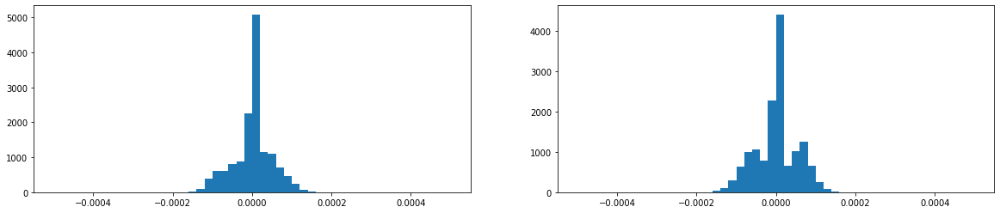

In [27]:
plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
plt.hist(gt['latv'],bins=50,range=(-5e-4,5e-4))
plt.subplot(1,2,2)
plt.hist(gt['lngv'],bins=50,range=(-5e-4,5e-4))
plt.show()

## create features

In [28]:
train_df['latv']=calc_velocity(train_df,'latDeg',th=5e-4)
train_df['lngv']=calc_velocity(train_df,'lngDeg',th=5e-4)

test_df['latv']=calc_velocity(test_df,'latDeg',th=5e-4)
test_df['lngv']=calc_velocity(test_df,'lngDeg',th=5e-4)

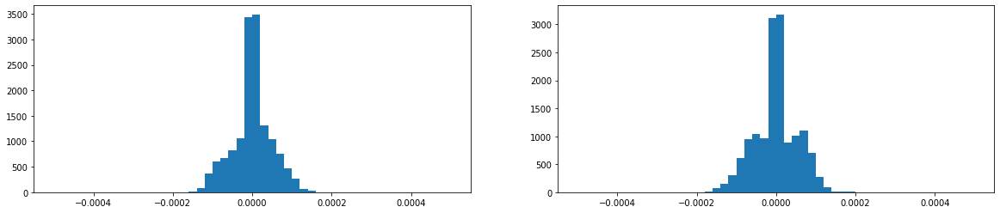

In [29]:
plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
plt.hist(train_df['latv'],bins=50,range=(-5e-4,5e-4))
plt.subplot(1,2,2)
plt.hist(train_df['lngv'],bins=50,range=(-5e-4,5e-4))
plt.show()

In [30]:
gt = gt.rename(columns={'latv':'latv_gt','lngv':'lngv_gt'})
train_df = pd.merge(train_df,gt.loc[:,['collectionName','phoneName','millisSinceGpsEpoch','latv_gt','lngv_gt']],\
                      on=['collectionName','phoneName','millisSinceGpsEpoch'],how='left')
train_df.head()

,collectionName,phoneName,millisSinceGpsEpoch,latDeg,lngDeg,heightAboveWgs84EllipsoidM,phone,pred_speedMps,latv,lngv,latv_gt,lngv_gt
0,2021-04-22-US-SJC-1,Pixel4,1303160575446,37.334561,-121.899322,-10.66,2021-04-22-US-SJC-1_Pixel4,0.041638,0.000000,0.000000,0.0,0.000000e+00
1,2021-04-22-US-SJC-1,Pixel4,1303160576446,37.334579,-121.899373,-6.76,2021-04-22-US-SJC-1_Pixel4,0.026854,0.000018,-0.000051,0.0,6.999983e-10
2,2021-04-22-US-SJC-1,Pixel4,1303160577446,37.334573,-121.899378,-10.73,2021-04-22-US-SJC-1_Pixel4,0.066402,-0.000006,-0.000005,0.0,0.000000e+00
3,2021-04-22-US-SJC-1,Pixel4,1303160578446,37.334578,-121.899400,-6.35,2021-04-22-US-SJC-1_Pixel4,0.002960,0.000005,-0.000022,0.0,9.000019e-10
4,2021-04-22-US-SJC-1,Pixel4,1303160579446,37.334581,-121.899417,-19.56,2021-04-22-US-SJC-1_Pixel4,0.005482,0.000003,-0.000017,0.0,8.000001e-10


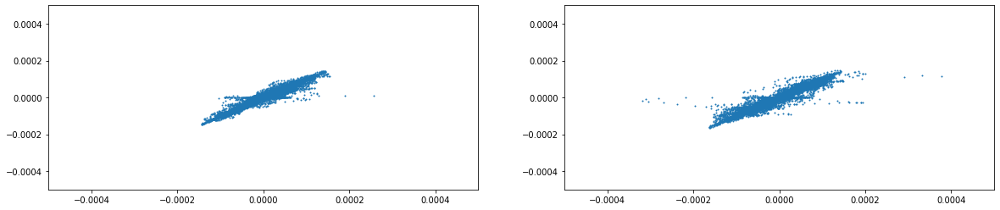

In [31]:
plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
plt.xlim(-5e-4,5e-4)
plt.ylim(-5e-4,5e-4)
plt.scatter(train_df['latv'], train_df['latv_gt'], s=1)
plt.subplot(1,2,2)
plt.xlim(-5e-4,5e-4)
plt.ylim(-5e-4,5e-4)
plt.scatter(train_df['lngv'], train_df['lngv_gt'], s=1)
plt.show()

In [32]:
set(train_df.columns)-set(test_df.columns)

{'latv_gt', 'lngv_gt'}

### IMUデータの追加

In [33]:
def gnss_log_to_dataframes(path):
    '''Load GNSS Log'''
    print('Loading ' + path, flush = True)
    gnss_section_names = {'Raw', 'UncalAccel', 'UncalGyro', 'UncalMag', 'Fix', 'Status', 'OrientationDeg'}
    with open(path) as f_open:
        datalines = f_open.readlines()

    datas = {k: [] for k in gnss_section_names}
    gnss_map = {k: [] for k in gnss_section_names}
    for dataline in datalines:
        is_header = dataline.startswith('#')
        dataline = dataline.strip('#').strip().split(',')
        # skip over notes, version numbers, etc
        if is_header and dataline[0] in gnss_section_names:
            gnss_map[dataline[0]] = dataline[1:]
        elif not is_header:
            datas[dataline[0]].append(dataline[1:])

    results = dict()
    for k, v in datas.items():
        results[k] = pd.DataFrame(v, columns=gnss_map[k])
    # pandas doesn't properly infer types from these lists by default
    for k, df in results.items():
        for col in df.columns:
            if col == 'CodeType':
                continue
            results[k][col] = pd.to_numeric(results[k][col])

    return results

In [34]:
def UTC2GpsEpoch(df):
    '''UTC to GpsEpoch
    
    utcTimeMillis         : UTC epoch (1970/1/1)
    millisSinceGpsEpoch   : GPS epoch(1980/1/6 midnight 12:00 UTC)
    
    Ref: https://www.kaggle.com/c/google-smartphone-decimeter-challenge/discussion/239187
    '''
    dt_offset = pd.to_datetime('1980-01-06 00:00:00') 
    dt_offset_in_ms = int(dt_offset.value / 1e6)
    df['millisSinceGpsEpoch'] = df['utcTimeMillis'] - dt_offset_in_ms + 18000
    return df

In [35]:
# pitch:y
# yaw:z
# roll:x
# euler angle -> rotation vector
def an2v(y_delta, z_delta, x_delta):
    '''
    Euler Angles ->Rotation Matrix -> Rotation Vector

    Input：
        1. y_delta          (float): the angle with rotateing around y-axis.
        2. z_delta         (float): the angle with rotateing around z-axis. 
        3. x_delta         (float): the angle with rotateing around x-axis. 
    Output：
        rx/ry/rz             (float): the rotation vector with rotateing 
    
    Code Ref.: https://www.zacobria.com/universal-robots-knowledge-base-tech-support-forum-hints-tips/python-code-example-of-converting-rpyeuler-angles-to-rotation-vectorangle-axis-for-universal-robots/
    (Note：In Code Ref: pitch=y,yaw=z,roll=x. But Google is pitch=x,yaw=z,roll=y)
    '''
    # yaw: z
    Rz_Matrix = np.matrix([
    [math.cos(z_delta), -math.sin(z_delta), 0],
    [math.sin(z_delta), math.cos(z_delta), 0],
    [0, 0, 1]
    ])
    
    # pitch: y
    Ry_Matrix = np.matrix([
    [math.cos(y_delta), 0, math.sin(y_delta)],
    [0, 1, 0],
    [-math.sin(y_delta), 0, math.cos(y_delta)]
    ])
    
    # roll: x
    Rx_Matrix = np.matrix([
    [1, 0, 0],
    [0, math.cos(x_delta), -math.sin(x_delta)],
    [0, math.sin(x_delta), math.cos(x_delta)]
    ])

    R = Rz_Matrix * Ry_Matrix * Rx_Matrix

    theta = math.acos(((R[0, 0] + R[1, 1] + R[2, 2]) - 1) / 2)
    multi = 1 / (2 * math.sin(theta))

    rx = multi * (R[2, 1] - R[1, 2]) * theta
    ry = multi * (R[0, 2] - R[2, 0]) * theta
    rz = multi * (R[1, 0] - R[0, 1]) * theta

    return rx, ry, rz

In [36]:
def prepare_imu_data(cname, pname, bl_df, phase):
    '''Prepare IMU Dataset (For Train: IMU+GT+BL; For Test: IMU+BL)
    Input：
        1. data_dir: data_dir
        2. dataset_name: dataset name（'train'/'test'）
        3. cname: CollectionName
        4. pname: phoneName
        5. bl_df: baseline's dataframe
    Output：df_all
    '''
    bl_df = bl_df.sort_values("millisSinceGpsEpoch")
    input_len = len(bl_df)

    # load GNSS log
    gnss_df = gnss_log_to_dataframes(str(root_dir / phase / cname / pname / f'{pname}_GnssLog.txt'))
    # if gnss_df['OrientationDeg'].shape == (0, 0):
    #     print(f"[DROP] {cname} - {pname}")
    #     return bl_df
    print('sub-dataset shape：')
    print('Raw:', gnss_df['Raw'].shape)
    print('Status:', gnss_df['Status'].shape)
    print('UncalAccel:', gnss_df['UncalAccel'].shape)
    print('UncalGyro:', gnss_df['UncalGyro'].shape)
    print('UncalMag:', gnss_df['UncalMag'].shape)
    print('OrientationDeg:', gnss_df['OrientationDeg'].shape)
    print('Fix:', gnss_df['Fix'].shape)


    # merge sub-datasets
    # accel + gyro
    imu_df = pd.merge_asof(gnss_df['UncalAccel'].sort_values('utcTimeMillis'),
                        gnss_df['UncalGyro'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
                        on = 'utcTimeMillis',
                        direction='nearest')
    # (accel + gyro) + mag
    imu_df = pd.merge_asof(imu_df.sort_values('utcTimeMillis'),
                        gnss_df['UncalMag'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
                        on = 'utcTimeMillis',
                        direction='nearest')

    # ((accel + gyro) + mag) + OrientationDeg
    imu_df = pd.merge_asof(imu_df.sort_values('utcTimeMillis'),
                        gnss_df['OrientationDeg'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
                        on = 'utcTimeMillis',
                        direction='nearest')

    # UTC->GpsEpoch
    imu_df = UTC2GpsEpoch(imu_df)

    # print IMU time
    dt_offset = pd.to_datetime('1980-01-06 00:00:00')
    dt_offset_in_ms = int(dt_offset.value / 1e6)
    tmp_datetime = pd.to_datetime(imu_df['millisSinceGpsEpoch'] + dt_offset_in_ms, unit='ms')
    print(f"imu_df time scope: {tmp_datetime.min()} - {tmp_datetime.max()}")

    # OrientationDeg -> Rotation Vector
    rxs = []
    rys = []
    rzs = []
    for i in range(len(imu_df)):
        y_delta = imu_df['rollDeg'].iloc[i]
        z_delta = imu_df['yawDeg'].iloc[i]
        x_delta = imu_df['pitchDeg'].iloc[i]
        rx, ry, rz = an2v(y_delta, z_delta, x_delta)
        rxs.append(rx)
        rys.append(ry)
        rzs.append(rz)

    imu_df['ahrsX'] = rxs
    imu_df['ahrsY'] = rys
    imu_df['ahrsZ'] = rzs

    # calibrate sensors' reading
    for axis in ['X', 'Y', 'Z']:
        imu_df['Accel{}Mps2'.format(axis)] = imu_df['UncalAccel{}Mps2'.format(axis)] - imu_df['Bias{}Mps2'.format(axis)]
        imu_df['Gyro{}RadPerSec'.format(axis)] = imu_df['UncalGyro{}RadPerSec'.format(axis)] - imu_df['Drift{}RadPerSec'.format(axis)]
        imu_df['Mag{}MicroT'.format(axis)] = imu_df['UncalMag{}MicroT'.format(axis)] - imu_df['Bias{}MicroT'.format(axis)]

        # clearn bias features
        imu_df.drop([
            'UncalAccel{}Mps2'.format(axis), 'UncalGyro{}RadPerSec'.format(axis), 'UncalMag{}MicroT'.format(axis), 
            'Bias{}Mps2'.format(axis), 'Drift{}RadPerSec'.format(axis), 'Bias{}MicroT'.format(axis)], 
            axis = 1, inplace = True) 


    df_all = pd.merge_asof(
        bl_df.sort_values("millisSinceGpsEpoch"), 
        imu_df.sort_values("millisSinceGpsEpoch"), 
        on='millisSinceGpsEpoch', direction="nearest")

    assert len(df_all) == input_len
    return df_all


In [37]:
df_list = []
for (collection_name, phone_name), df in tqdm(train_df.groupby(['collectionName', 'phoneName'])):
    df = prepare_imu_data(collection_name, phone_name, df, phase="train")
    df_list.append(df)
train_imu_df = pd.concat(df_list)

  0%|          | 0/6 [00:00<?, ?it/s]

Loading ../../input/google-smartphone-decimeter-challenge/train/2021-04-22-US-SJC-1/Pixel4/Pixel4_GnssLog.txt
sub-dataset shape：
Raw: (69759, 36)
Status: (105134, 13)
UncalAccel: (300038, 8)
UncalGyro: (300038, 8)
UncalMag: (289948, 8)
OrientationDeg: (180408, 5)
Fix: (0, 11)
imu_df time scope: 2021-04-22 21:02:55.866000 - 2021-04-22 21:51:07.442000
Loading ../../input/google-smartphone-decimeter-challenge/train/2021-04-22-US-SJC-1/SamsungS20Ultra/SamsungS20Ultra_GnssLog.txt
sub-dataset shape：
Raw: (103693, 36)
Status: (39416, 13)
UncalAccel: (282622, 8)
UncalGyro: (282622, 8)
UncalMag: (282622, 8)
OrientationDeg: (282623, 5)
Fix: (0, 11)
imu_df time scope: 2021-04-22 21:02:57.127000 - 2021-04-22 21:50:03.236000
Loading ../../input/google-smartphone-decimeter-challenge/train/2021-04-28-US-SJC-1/Pixel4/Pixel4_GnssLog.txt
sub-dataset shape：
Raw: (58202, 36)
Status: (82169, 13)
UncalAccel: (209435, 8)
UncalGyro: (209435, 8)
UncalMag: (201994, 8)
OrientationDeg: (126160, 5)
Fix: (0, 11)
im

In [38]:
df_list = []
for (collection_name, phone_name), df in tqdm(test_df.groupby(['collectionName', 'phoneName'])):
    df = prepare_imu_data(collection_name, phone_name, df, phase="test")
    df_list.append(df)
test_imu_df = pd.concat(df_list)

  0%|          | 0/3 [00:00<?, ?it/s]

Loading ../../input/google-smartphone-decimeter-challenge/test/2021-04-22-US-SJC-2/SamsungS20Ultra/SamsungS20Ultra_GnssLog.txt
sub-dataset shape：
Raw: (89737, 36)
Status: (40793, 13)
UncalAccel: (232389, 8)
UncalGyro: (232389, 8)
UncalMag: (232389, 8)
OrientationDeg: (232342, 5)
Fix: (0, 11)
imu_df time scope: 2021-04-22 22:01:14.226000 - 2021-04-22 22:39:57.997000
Loading ../../input/google-smartphone-decimeter-challenge/test/2021-04-29-US-SJC-3/Pixel4/Pixel4_GnssLog.txt
sub-dataset shape：
Raw: (54937, 36)
Status: (83035, 13)
UncalAccel: (205625, 8)
UncalGyro: (205626, 8)
UncalMag: (197761, 8)
OrientationDeg: (123877, 5)
Fix: (0, 11)
imu_df time scope: 2021-04-29 19:52:06.364000 - 2021-04-29 20:25:08.405000
Loading ../../input/google-smartphone-decimeter-challenge/test/2021-04-29-US-SJC-3/SamsungS20Ultra/SamsungS20Ultra_GnssLog.txt
sub-dataset shape：
Raw: (78662, 36)
Status: (40565, 13)
UncalAccel: (206266, 8)
UncalGyro: (206266, 8)
UncalMag: (206266, 8)
OrientationDeg: (206266, 5)
Fi

In [39]:
train_imu_df.shape, test_imu_df.shape

((14513, 29), (6364, 27))

In [40]:
def create_features(input_df):
    output_df = input_df.copy()
    for i in [1,2,4,8,16,32]:
        output_df['dlatp'+str(i).zfill(2)]=calc_velocity(output_df,'latDeg',shift=i,th=1e-3)
        output_df['dlngp'+str(i).zfill(2)]=calc_velocity(output_df,'lngDeg',shift=i,th=1e-3)
        output_df['dlata'+str(i).zfill(2)]=calc_velocity(output_df,'latDeg',shift=(-i),th=1e-3)
        output_df['dlnga'+str(i).zfill(2)]=calc_velocity(output_df,'lngDeg',shift=(-i),th=1e-3)
        for j in range(1,2,4):
            output_df['dlatp'+str(i).zfill(2)+'_shiftp'+str(j).zfill(2)] = calc_shift(output_df,'dlatp'+str(i).zfill(2),shift=j)
            output_df['dlngp'+str(i).zfill(2)+'_shiftp'+str(j).zfill(2)] = calc_shift(output_df,'dlngp'+str(i).zfill(2),shift=j)
            output_df['dlatp'+str(i).zfill(2)+'_shifta'+str(j).zfill(2)] = calc_shift(output_df,'dlatp'+str(i).zfill(2),shift=(-j))
            output_df['dlngp'+str(i).zfill(2)+'_shifta'+str(j).zfill(2)] = calc_shift(output_df,'dlngp'+str(i).zfill(2),shift=(-j))
            output_df['dlata'+str(i).zfill(2)+'_shiftp'+str(j).zfill(2)] = calc_shift(output_df,'dlata'+str(i).zfill(2),shift=j)
            output_df['dlnga'+str(i).zfill(2)+'_shiftp'+str(j).zfill(2)] = calc_shift(output_df,'dlnga'+str(i).zfill(2),shift=j)
            output_df['dlata'+str(i).zfill(2)+'_shifta'+str(j).zfill(2)] = calc_shift(output_df,'dlata'+str(i).zfill(2),shift=(-j))
            output_df['dlnga'+str(i).zfill(2)+'_shifta'+str(j).zfill(2)] = calc_shift(output_df,'dlnga'+str(i).zfill(2),shift=(-j))
    return output_df

In [41]:
# def create_features(input_df, phase="train"):
#     output_df = pd.DataFrame()
#     for (collection_name, phone_name), df in input_df.groupby(["collectionName", "phoneName"]):
#         df = df.sort_values("millisSinceGpsEpoch").reset_index(drop=True)

#         if phase == "train":
#             df = df[["collectionName", "phoneName", "millisSinceGpsEpoch", "latDeg", "lngDeg", 'latDeg_cov', 'lngDeg_cov', "speedMps"]]
#         else:
#             df = df[["collectionName", "phoneName", "millisSinceGpsEpoch", "latDeg", "lngDeg", 'latDeg_cov', 'lngDeg_cov']]
        
#         for i in [1, 2, 4, 8, 10, 16, 20, 32]:
#             df[f"pre{i}_dist"] = calc_haversine(df["latDeg"], df["lngDeg"], df["latDeg"].shift(i), df["lngDeg"].shift(i)).abs()
#             df[f"post{i}_dist"] = calc_haversine(df["latDeg"], df["lngDeg"], df["latDeg"].shift(i*-1), df["lngDeg"].shift(i*-1)).abs()
#             df[f"pre{i}_delta_t"] = (df["millisSinceGpsEpoch"] - df["millisSinceGpsEpoch"].shift(i)).abs() / 1000
#             df[f"post{i}_delta_t"] = (df["millisSinceGpsEpoch"] - df["millisSinceGpsEpoch"].shift(i*-1)).abs() / 1000
#             df[f"pre{i}_speedMps"] = df[f"pre{i}_dist"] / df[f"pre{i}_delta_t"]
#             df[f"post{i}_speedMps"] = df[f"post{i}_dist"] / df[f"post{i}_delta_t"]
#             df[f"mean{i}_speedMps"] = (df[f"pre{i}_speedMps"] + df[f"post{i}_speedMps"]) / 2
#             df[f"pre{i}_latDeg_cov"] = df["latDeg_cov"].shift(i)
#             df[f"post{i}_latDeg_cov"] = df["latDeg_cov"].shift(i*-1)
        
#         df["elapsed_time"] = (df["millisSinceGpsEpoch"] - df["millisSinceGpsEpoch"].min()) / 1000
#         df["arrived_time"] = (df["millisSinceGpsEpoch"].max() - df["millisSinceGpsEpoch"]) / 1000
#         output_df = pd.concat([output_df, df]).reset_index(drop=True)
 
#     return output_df

In [42]:
train_feat_df = create_features(train_imu_df)
test_feat_df = create_features(test_imu_df)
train_feat_df.shape, test_feat_df.shape

((14513, 101), (6364, 99))

In [43]:
set(train_feat_df.columns)-set(test_feat_df.columns)

{'latv_gt', 'lngv_gt'}

## preprocessing

In [44]:
from sklearn.preprocessing import LabelEncoder

whole_df = pd.concat([train_feat_df, test_feat_df]).reset_index(drop=True)

le_co = LabelEncoder()
le_co.fit(whole_df['collectionName'])
le_ph = LabelEncoder()
le_ph.fit(whole_df['phoneName'])


def preprocess(input_df, le1=le_co, le2=le_ph):
    output_df = input_df.copy()
    # LE
    output_df['collectionName'] = le1.transform(input_df['collectionName'])
    output_df['phoneName'] = le2.transform(input_df['phoneName'])
    return output_df

train = preprocess(train_feat_df).reset_index(drop=True)
test = preprocess(test_feat_df).reset_index(drop=True)

In [45]:

params = {
    # 目的関数. これの意味で最小となるようなパラメータを探します. 
    'objective': 'rmse', 
    'metric':'rmse',

     # 学習率. 小さいほどなめらかな決定境界が作られて性能向上に繋がる場合が多いです、
    # がそれだけ木を作るため学習に時間がかかります
    'learning_rate': .05,

    # L2 Reguralization
    'reg_lambda': 1.,
    # こちらは L1 
    'reg_alpha': .1,

    # 木の深さ. 深い木を許容するほどより複雑な交互作用を考慮するようになります
    'max_depth': 5, 

    # 木の最大数. early_stopping という枠組みで木の数は制御されるようにしていますのでとても大きい値を指定しておきます.
    'n_estimators': 100000, 

    # 木を作る際に考慮する特徴量の割合. 1以下を指定すると特徴をランダムに欠落させます。小さくすることで, まんべんなく特徴を使うという効果があります.
    'colsample_bytree': .5,

    # 最小分割でのデータ数. 小さいとより細かい粒度の分割方法を許容します.
    'min_child_samples': 10,

    # bagging の頻度と割合
    'subsample_freq': 3,
    'subsample': .9,

    # 特徴重要度計算のロジック(後述)
    'importance_type': 'gain', 
    'random_state': 71,
}

In [46]:
import lightgbm as lgbm
# import optuna.integration.lightgbm as lgb
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error
from wandb.lightgbm import wandb_callback
from sklearn.model_selection import StratifiedKFold, GroupKFold
import wandb


def fit_lgbm(X, 
             y, 
             test,
             target_col="latv",
             params: dict=None, 
             verbose: int=50):
    """lightGBM を CrossValidation の枠組みで学習を行なう function"""
    # パラメータがないときは、空の dict で置き換える
    if params is None:
        params = {}

    oofs = []  # 全てのoofをdfで格納する
    preds = []  # 全ての予測値をdfで格納する
    val_scores = []

    skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)
    train_fold = [(trn_idx, val_idx) for trn_idx, val_idx in skf.split(X,X['collectionName'])]
    for fold in range(5):
        # 指定したfoldのみループを回す
        if fold not in USE_FOLDS:
            continue

        print('=' * 20)
        print(f'Fold {fold}')
        print('=' * 20)


        # training data の target と同じだけのゼロ配列を用意
        oof_pred = np.zeros(y.shape[0], dtype=np.float)

        # train/valid data
        trn_idx_for_train, val_idx_for_train = train_fold[fold]
        x_train = X.loc[trn_idx_for_train, :].reset_index(drop=True)
        x_valid = X.loc[val_idx_for_train, :].reset_index(drop=True)
        y_train = y.loc[trn_idx_for_train].reset_index(drop=True)
        y_valid = y.loc[val_idx_for_train].reset_index(drop=True)

        clf = lgbm.LGBMRegressor(**params)
        # train_data = lgbm.Dataset(x_train, label=y_train)
        # valid_data = lgbm.Dataset(x_valid, label=y_valid)


        # loggers
        RUN_NAME = EXP_NAME + "_" + EXP_MESSAGE
        wandb.init(project='outdoor', entity='kuto5046', group=RUN_NAME)
        wandb.run.name = RUN_NAME + f'-fold-{fold}'
        wandb_config = wandb.config
        wandb_config['model_name'] = "lightGBM"
        wandb_config['comment'] = NOTES

        clf.fit(x_train, y_train,
                eval_set=[(x_valid, y_valid)],  
                early_stopping_rounds=100,
                verbose=verbose,
                callbacks=[wandb_callback()])

        pred_i = clf.predict(x_valid)
        x_valid[f"{target_col}_pred"] = pred_i
        x_valid[f"{target_col}_gt"] = y_valid.to_numpy() 
        oofs.append(x_valid)
        
        score = mean_squared_error(y_valid, pred_i, squared=False)
        val_scores.append(score)
        print(f'Fold {fold} RMSE: {score}')

        wandb.finish()
        
        pred = clf.predict(test)
        preds.append(pred)
    oof_df = pd.concat(oofs).reset_index(drop=True) 
    all_score = mean_squared_error(oof_df[f"{target_col}"], oof_df[f"{target_col}_pred"], squared=False)
    print('-' * 50)
    print('FINISHED | Whole RMSE: {}'.format(all_score))
    features = x_train.columns.values
    return oof_df, preds

In [47]:
train.drop(["phone"], axis=1, inplace=True)
test.drop(["phone"], axis=1, inplace=True)

In [48]:
target_col = "latv"
y = train[target_col]
X = train.drop(["latv_gt", "lngv_gt"], axis=1)
lat_oof, lat_preds = fit_lgbm(X, y, test, target_col, params, verbose=200)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
Fold 0
wandb: Currently logged in as: kuto5046 (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.28121e-05
[400]	valid_0's rmse: 3.26871e-05
[600]	valid_0's rmse: 3.26449e-05
[800]	valid_0's rmse: 3.26271e-05
[1000]	valid_0's rmse: 3.25989e-05
[1200]	valid_0's rmse: 3.25854e-05
Early stopping, best iteration is:
[1164]	valid_0's rmse: 3.25854e-05
Fold 0 RMSE: 3.258540584139989e-05


valid_0_rmse,3e-05
_runtime,18
_timestamp,1626153420
_step,1263


valid_0_rmse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▂▃▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
_timestamp,▁▂▃▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 1
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.28651e-05
[400]	valid_0's rmse: 3.27367e-05
[600]	valid_0's rmse: 3.27076e-05
[800]	valid_0's rmse: 3.26799e-05
Early stopping, best iteration is:
[882]	valid_0's rmse: 3.26619e-05
Fold 1 RMSE: 3.26619332330139e-05


valid_0_rmse,3e-05
_runtime,13
_timestamp,1626153437
_step,981


valid_0_rmse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▂▂▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██████
_timestamp,▁▂▂▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██████
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 2
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.36726e-05
[400]	valid_0's rmse: 3.35257e-05
[600]	valid_0's rmse: 3.34694e-05
[800]	valid_0's rmse: 3.34613e-05
[1000]	valid_0's rmse: 3.3437e-05
Early stopping, best iteration is:
[1091]	valid_0's rmse: 3.34357e-05
Fold 2 RMSE: 3.3435721558196596e-05


valid_0_rmse,3e-05
_runtime,3
_timestamp,1626153443
_step,1190


valid_0_rmse,█▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅████
_timestamp,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅████
_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 3
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.37919e-05
[400]	valid_0's rmse: 3.36637e-05
[600]	valid_0's rmse: 3.36229e-05
[800]	valid_0's rmse: 3.36028e-05
[1000]	valid_0's rmse: 3.35928e-05
[1200]	valid_0's rmse: 3.35611e-05
Early stopping, best iteration is:
[1179]	valid_0's rmse: 3.35611e-05
Fold 3 RMSE: 3.356113285261002e-05


valid_0_rmse,3e-05
_runtime,3
_timestamp,1626153449
_step,1278


valid_0_rmse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅█████
_timestamp,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅█████
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 4
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.38465e-05
[400]	valid_0's rmse: 3.37263e-05
[600]	valid_0's rmse: 3.36764e-05
[800]	valid_0's rmse: 3.3653e-05
[1000]	valid_0's rmse: 3.3628e-05
[1200]	valid_0's rmse: 3.36115e-05
Early stopping, best iteration is:
[1269]	valid_0's rmse: 3.36085e-05
Fold 4 RMSE: 3.360845583431306e-05


valid_0_rmse,3e-05
_runtime,3
_timestamp,1626153455
_step,1368


valid_0_rmse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅███████
_timestamp,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅███████
_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


--------------------------------------------------
FINISHED | Whole RMSE: 3.317353481044955e-05


In [49]:
target_col = "lngv"
y = train[target_col]
X = train.drop(["latv_gt", "lngv_gt"], axis=1)
lng_oof, lng_preds = fit_lgbm(X, y, test, target_col, params, verbose=200)

Fold 0
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.35328e-05
[400]	valid_0's rmse: 3.33964e-05
[600]	valid_0's rmse: 3.33525e-05
[800]	valid_0's rmse: 3.33379e-05
[1000]	valid_0's rmse: 3.33326e-05
[1200]	valid_0's rmse: 3.32972e-05
Early stopping, best iteration is:
[1118]	valid_0's rmse: 3.32972e-05
Fold 0 RMSE: 3.329715644893367e-05


valid_0_rmse,3e-05
_runtime,14
_timestamp,1626153481
_step,1217


valid_0_rmse,█▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▂▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████
_timestamp,▁▂▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████
_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 1
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.35608e-05
[400]	valid_0's rmse: 3.34085e-05
[600]	valid_0's rmse: 3.33838e-05
[800]	valid_0's rmse: 3.33579e-05
Early stopping, best iteration is:
[852]	valid_0's rmse: 3.33531e-05
Fold 1 RMSE: 3.335314353412574e-05


valid_0_rmse,3e-05
_runtime,13
_timestamp,1626153497
_step,951


valid_0_rmse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▄▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
_timestamp,▁▄▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 2
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.26254e-05
[400]	valid_0's rmse: 3.24543e-05
[600]	valid_0's rmse: 3.24248e-05
Early stopping, best iteration is:
[593]	valid_0's rmse: 3.24248e-05
Fold 2 RMSE: 3.242479485753725e-05


valid_0_rmse,3e-05
_runtime,14
_timestamp,1626153515
_step,692


valid_0_rmse,█▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▃▅▅▅▇▇▇▇▇▇▇▇▇█████████████████████████
_timestamp,▁▁▃▅▅▅▇▇▇▇▇▇▇▇▇█████████████████████████
_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 3
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.46144e-05
[400]	valid_0's rmse: 3.44952e-05
[600]	valid_0's rmse: 3.44147e-05
Early stopping, best iteration is:
[609]	valid_0's rmse: 3.4414e-05
Fold 3 RMSE: 3.441399010083339e-05


valid_0_rmse,3e-05
_runtime,11
_timestamp,1626153530
_step,708


valid_0_rmse,█▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▂▂▄▅▇█████████████████████████████████
_timestamp,▁▁▂▂▄▅▇█████████████████████████████████
_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 4
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[200]	valid_0's rmse: 3.19334e-05
[400]	valid_0's rmse: 3.18035e-05
[600]	valid_0's rmse: 3.17454e-05
[800]	valid_0's rmse: 3.17034e-05
Early stopping, best iteration is:
[887]	valid_0's rmse: 3.16716e-05
Fold 4 RMSE: 3.1671617537512394e-05


valid_0_rmse,3e-05
_runtime,12
_timestamp,1626153546
_step,986


valid_0_rmse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▃▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████
_timestamp,▁▃▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


--------------------------------------------------
FINISHED | Whole RMSE: 3.304516005957282e-05


In [50]:
oof = pd.merge(
    lat_oof[["collectionName", "phoneName", "millisSinceGpsEpoch", "latDeg","lngDeg", "latv", "lngv", "latv_pred"]], 
    lng_oof[["collectionName", "phoneName", "millisSinceGpsEpoch", "lngv_pred"]], 
    on=["collectionName", "phoneName", "millisSinceGpsEpoch"])

In [51]:
oof = oof.merge(train[["collectionName", "phoneName", "millisSinceGpsEpoch", "latv_gt", "lngv_gt"]], how="left", on=["collectionName", "phoneName", "millisSinceGpsEpoch"])

In [52]:
oof["collectionName"] = le_co.inverse_transform(oof["collectionName"])
oof["phoneName"] = le_ph.inverse_transform(oof["phoneName"])

In [53]:
oof

,collectionName,phoneName,millisSinceGpsEpoch,latDeg,lngDeg,latv,lngv,latv_pred,lngv_pred,latv_gt,lngv_gt
0,2021-04-22-US-SJC-1,Pixel4,1303160588446,37.334574,-121.899405,1.141931e-06,2.397273e-06,1.219358e-06,2.412356e-06,0.000000e+00,0.000000e+00
1,2021-04-22-US-SJC-1,Pixel4,1303160593446,37.334575,-121.899402,1.909278e-06,-6.254012e-07,1.864924e-06,-5.769302e-07,0.000000e+00,0.000000e+00
2,2021-04-22-US-SJC-1,Pixel4,1303160594446,37.334578,-121.899402,2.425607e-06,1.378288e-07,2.329152e-06,1.783673e-07,8.000001e-10,9.000019e-10
3,2021-04-22-US-SJC-1,Pixel4,1303160599446,37.334586,-121.899404,-5.679379e-07,5.208183e-07,-5.551740e-07,4.552333e-07,1.700002e-09,-5.180000e-08
4,2021-04-22-US-SJC-1,Pixel4,1303160602446,37.334579,-121.899403,-3.029617e-06,-1.862795e-06,-2.886413e-06,-1.769610e-06,1.250000e-08,-5.740000e-08
...,...,...,...,...,...,...,...,...,...,...,...
14508,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760286999,37.334447,-121.899608,2.045556e-06,1.642621e-07,2.113960e-06,1.214483e-07,0.000000e+00,0.000000e+00
14509,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760288000,37.334452,-121.899606,4.183281e-06,1.101412e-06,3.745648e-06,1.064338e-06,0.000000e+00,0.000000e+00
14510,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760295000,37.334464,-121.899586,2.812520e-06,3.084041e-06,2.825238e-06,3.366725e-06,0.000000e+00,0.000000e+00
14511,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760307000,37.334499,-121.899622,-2.790877e-06,-3.650789e-06,-2.794271e-06,-3.605048e-06,0.000000e+00,0.000000e+00


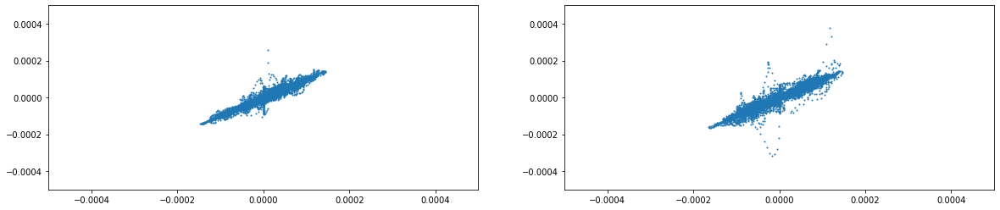

In [54]:
plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
plt.xlim(-5e-4,5e-4)
plt.ylim(-5e-4,5e-4)
plt.scatter(oof['latv_gt'],oof['latv'],s=1)
plt.subplot(1,2,2)
plt.xlim(-5e-4,5e-4)
plt.ylim(-5e-4,5e-4)
plt.scatter(oof['lngv_gt'],oof['lngv'],s=1)
plt.show()

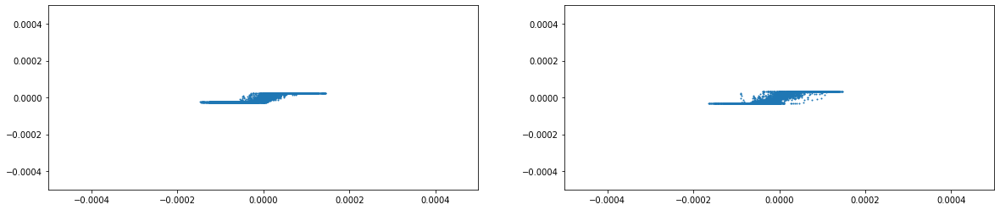

In [55]:
plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
plt.xlim(-5e-4,5e-4)
plt.ylim(-5e-4,5e-4)
plt.scatter(oof['latv_gt'],oof['latv_pred'],s=1)
plt.subplot(1,2,2)
plt.xlim(-5e-4,5e-4)
plt.ylim(-5e-4,5e-4)
plt.scatter(oof['lngv_gt'],oof['lngv_pred'],s=1)
plt.show()

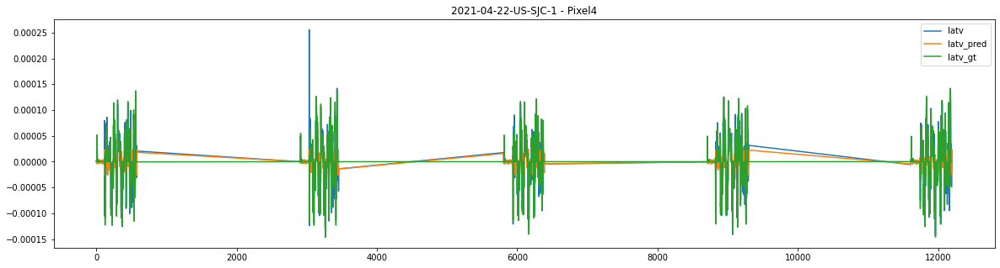

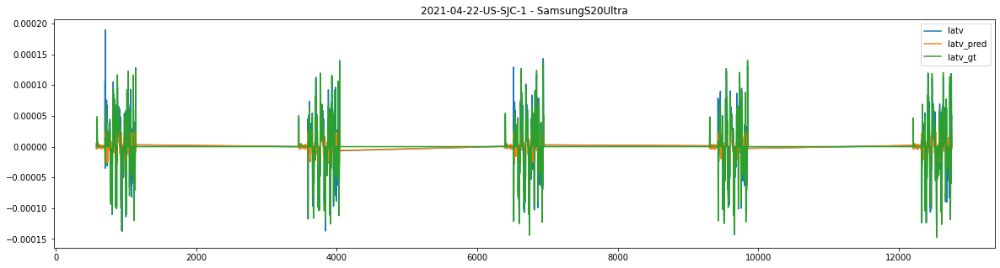

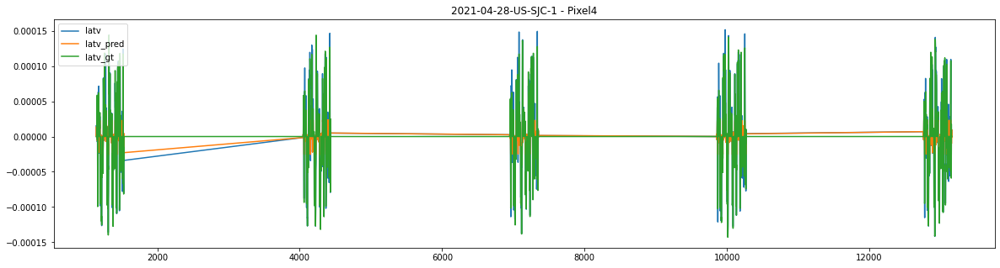

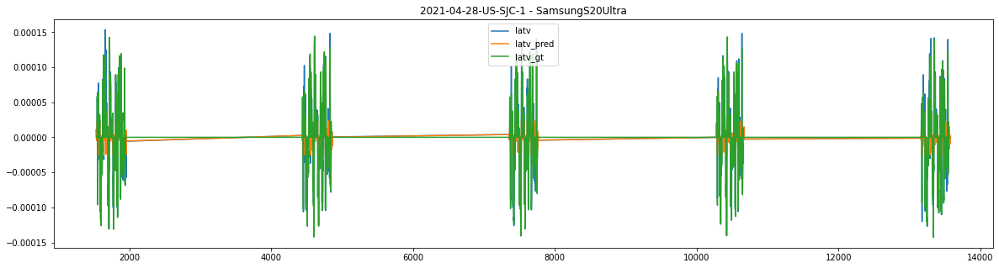

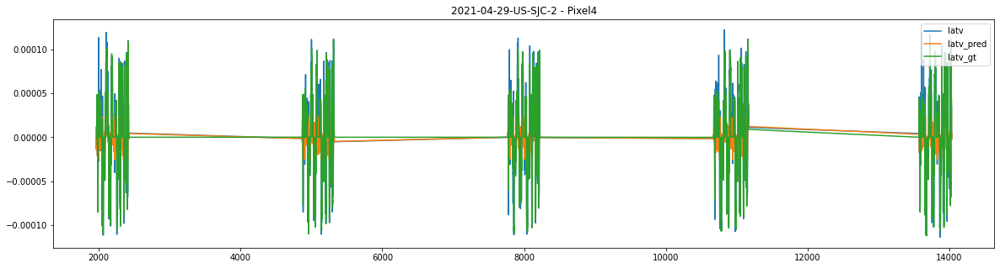

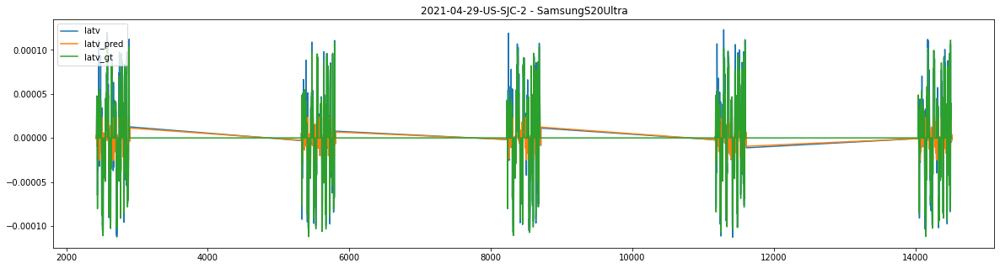

In [56]:
for (collection_name, phone_name), df in oof.groupby(["collectionName", "phoneName"]):
    df[["latv", "latv_pred", "latv_gt"]].plot(figsize=(20, 5))
    plt.title(f"{collection_name} - {phone_name}")

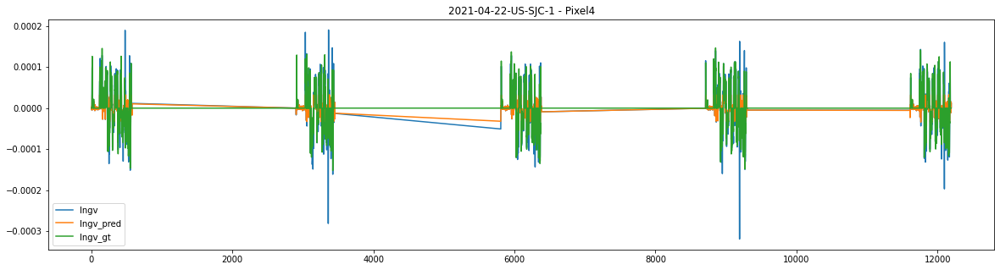

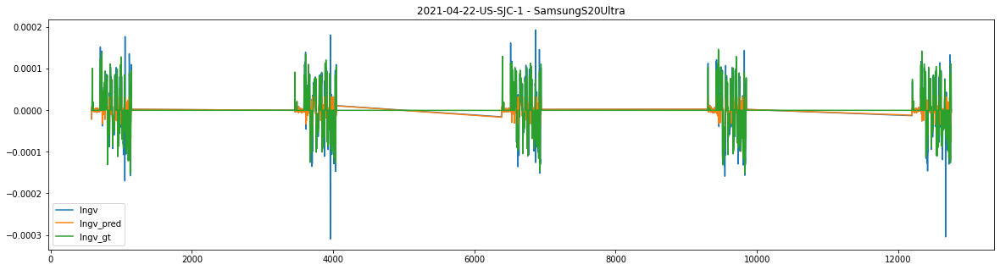

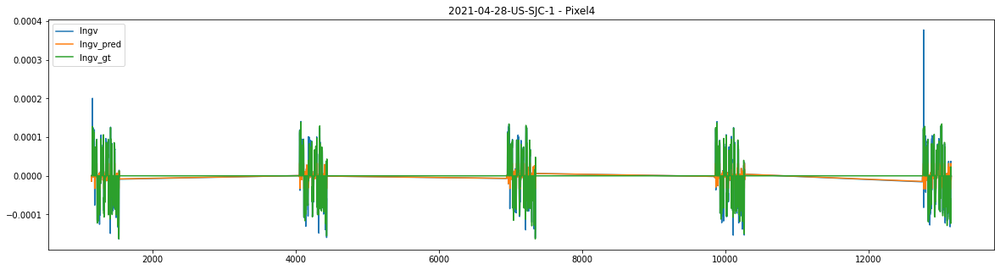

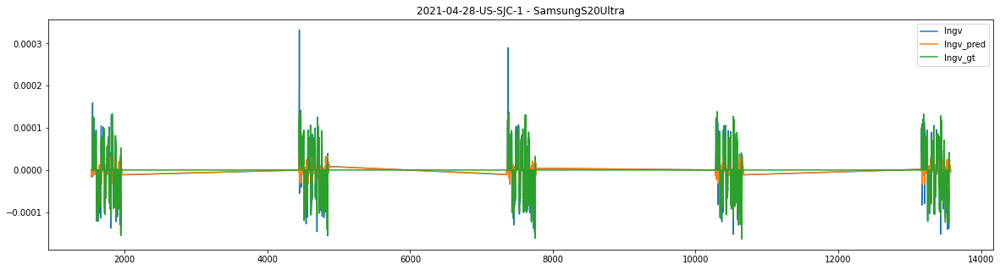

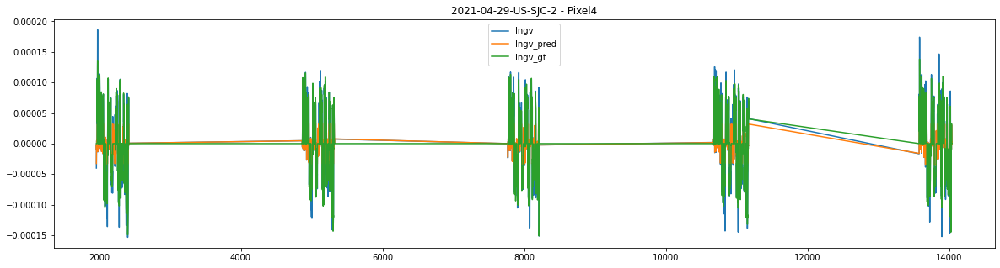

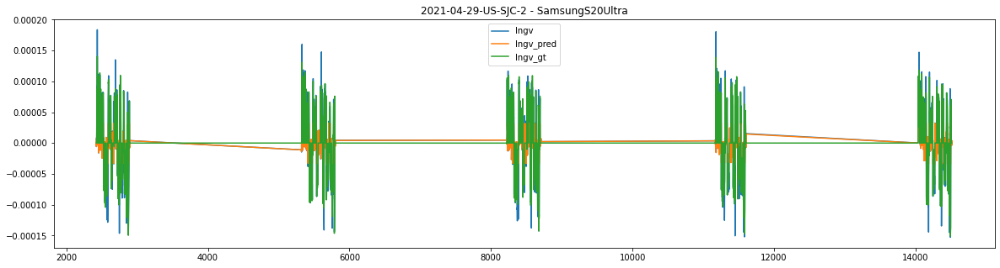

In [57]:
for (collection_name, phone_name), df in oof.groupby(["collectionName", "phoneName"]):
    df[["lngv", "lngv_pred", "lngv_gt"]].plot(figsize=(20, 5))
    plt.title(f"{collection_name} - {phone_name}")

In [58]:
print("baseline:", mean_squared_error(oof["latv_gt"], oof["latv"]))
print("pred:", mean_squared_error(oof["latv_gt"], oof["latv_pred"]))

baseline: 1.495542555915399e-10
pred: 1.1129086613837115e-09


In [59]:
print("baseline:", mean_squared_error(oof["lngv_gt"], oof["lngv"]))
print("pred:", mean_squared_error(oof["lngv_gt"], oof["lngv_pred"]))

baseline: 2.916048307212873e-10
pred: 1.0090521152177834e-09


In [60]:
oof = oof.merge(gt.rename(columns={"latDeg":"latDeg_gt","lngDeg":"lngDeg_gt"})[["collectionName", "phoneName", "millisSinceGpsEpoch", "latDeg_gt", "lngDeg_gt"]], how="left", on=["collectionName", "phoneName", "millisSinceGpsEpoch"])

## 速度ベクトルを可視化

### Ground Truth

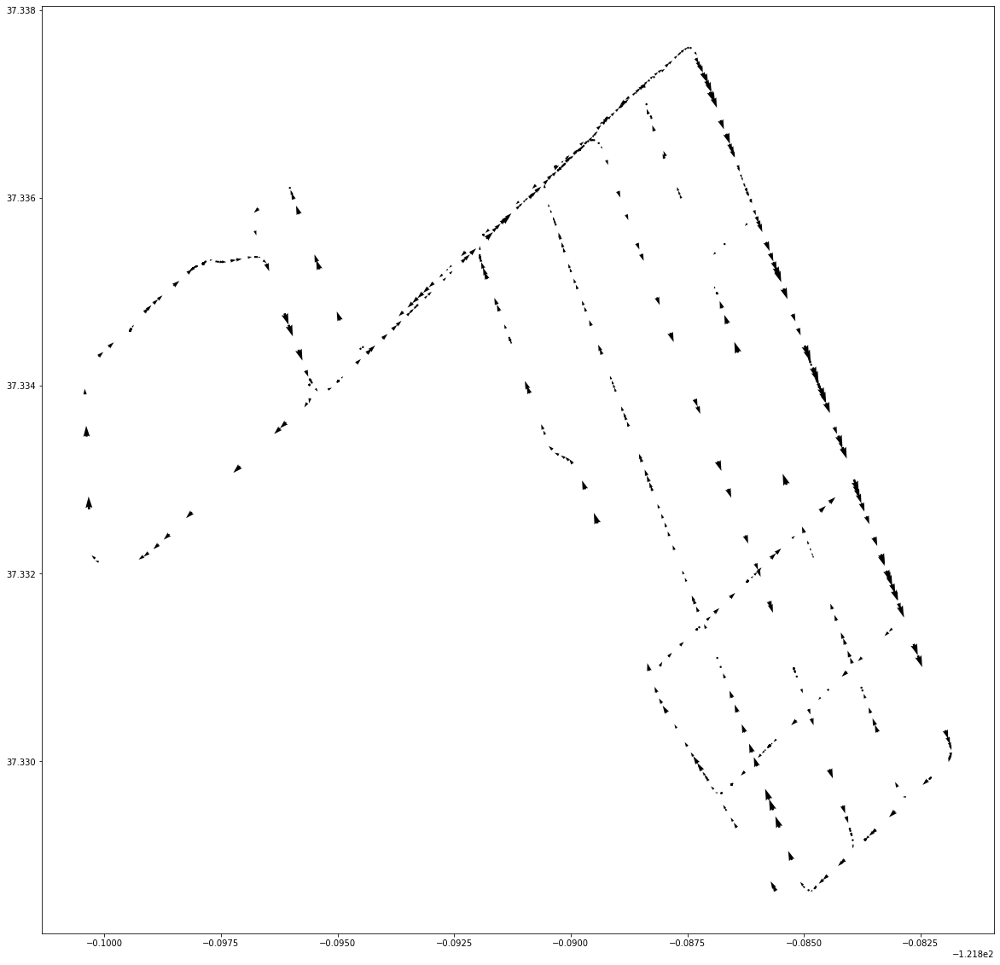

In [61]:
tmp = oof[:1000]

# 矢印（ベクトル）の始点
X = tmp["lngDeg_gt"]
Y = tmp["latDeg_gt"]
# 矢印（ベクトル）の成分
U = tmp["lngv_gt"]
V = tmp["latv_gt"]

# 矢印（ベクトル）
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
ax.quiver(X,Y,U,V,angles='xy',scale_units='xy',scale=1)

### baseline

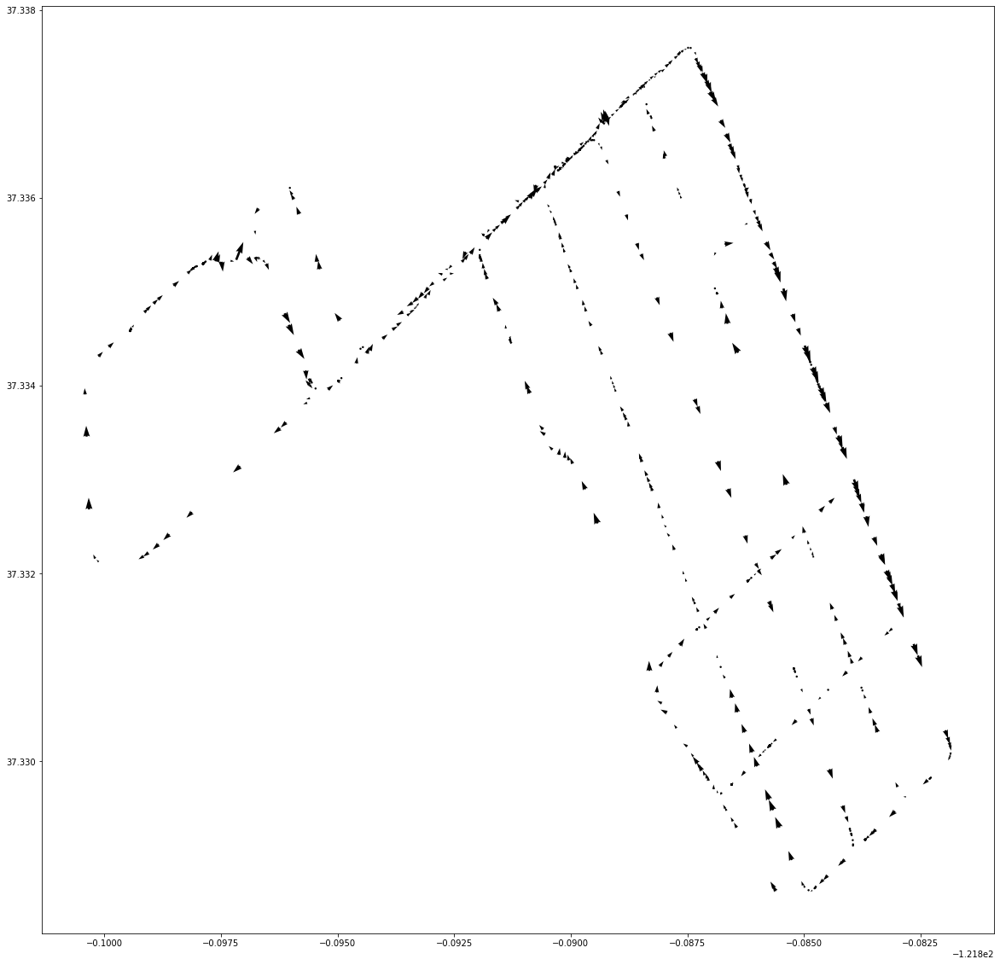

In [62]:
tmp = oof[:1000]

# 矢印（ベクトル）の始点
X = tmp["lngDeg_gt"]
Y = tmp["latDeg_gt"]
# 矢印（ベクトル）の成分
U = tmp["lngv"]
V = tmp["latv"]

# 矢印（ベクトル）
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
ax.quiver(X,Y,U,V,angles='xy',scale_units='xy',scale=1)

### pred

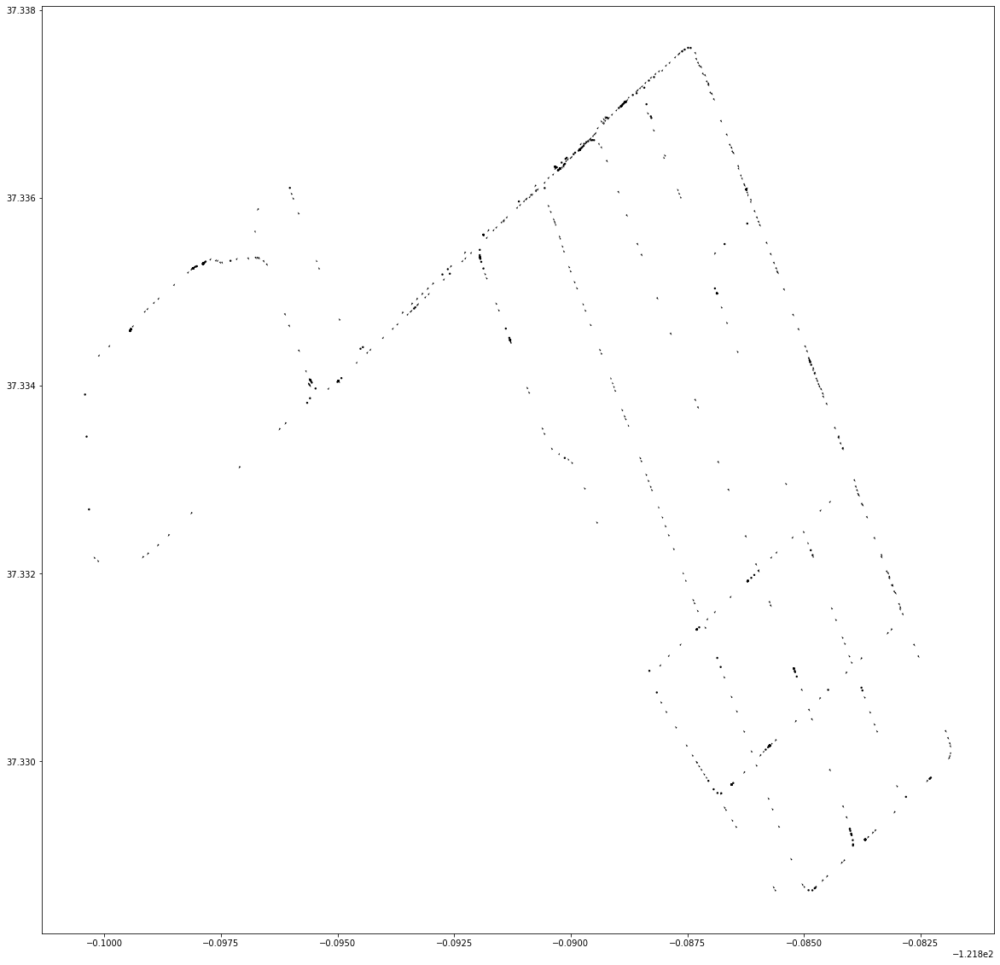

In [63]:
tmp = oof[:1000]

# 矢印（ベクトル）の始点
X = tmp["lngDeg_gt"]
Y = tmp["latDeg_gt"]
# 矢印（ベクトル）の成分
U = tmp["lngv_pred"]
V = tmp["latv_pred"]

# 矢印（ベクトル）
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
ax.quiver(X,Y,U,V,angles='xy',scale_units='xy',scale=1)

baselineに比べるとよくなっている

## コスト最小化
絶対位置予測と相対位置予測を行い、以下のnotebookの式が最小となる座標を求める  
https://www.kaggle.com/saitodevel01/indoor-post-processing-by-cost-minimization  

In [64]:
def velvec2delta(input_df):
    # delta*1000/delta_t = velocity(∆/s)
    # delta = velocity * delta_t / 1000
    output_df = pd.DataFrame()
    for phone, df in input_df.groupby(["phone"]):
        df = df.sort_values("millisSinceGpsEpoch")
        # n番目の座標とn+1番目の座標の差分をdeltaとする
        t_delta = (df["millisSinceGpsEpoch"] - df["millisSinceGpsEpoch"].shift(1))
        df["lat_delta"] = df["latv"] * t_delta / 1000
        df["lng_delta"] = df["lngv"] * t_delta / 1000

        assert df["lat_delta"].isna().sum() == 1
        assert df["lng_delta"].isna().sum() == 1

        # 最初の地点はdelta=0とする
        df["lat_delta"].fillna(0, inplace=True)
        df["lng_delta"].fillna(0, inplace=True)
        output_df = pd.concat([output_df, df])
    return output_df.sort_index()

In [65]:
def correct_path(args):
    phone, df = args
    df = df.dropna().sort_values("millisSinceGpsEpoch")

    T_ref  = df['millisSinceGpsEpoch'].to_numpy()
    xy_hat = df[['lngDeg', 'latDeg']].to_numpy()
    rel_positions = df[['millisSinceGpsEpoch', 'lng_delta', 'lat_delta']].to_numpy()

    if T_ref[-1] > rel_positions[-1, 0]:
        rel_positions = [np.array([[0, 0, 0]]), rel_positions, np.array([[T_ref[-1], 0, 0]])]
    else:
        rel_positions = [np.array([[0, 0, 0]]), rel_positions]
    rel_positions = np.concatenate(rel_positions)
    
    T_rel = rel_positions[:, 0]
    delta_xy_hat = np.diff(scipy.interpolate.interp1d(T_rel, np.cumsum(rel_positions[:, 1:], axis=0), axis=0)(T_ref), axis=0)

    N = xy_hat.shape[0]
    delta_t = np.diff(T_ref)
    alpha = (8.1)**(-2) * np.ones(N)
    beta  = (0.3 + 0.3 * 1e-3 * delta_t)**(-2)
    A = scipy.sparse.spdiags(alpha, [0], N, N)
    B = scipy.sparse.spdiags( beta, [0], N-1, N-1)
    D = scipy.sparse.spdiags(np.stack([-np.ones(N), np.ones(N)]), [0, 1], N-1, N)

    Q = A + (D.T @ B @ D)
    c = (A @ xy_hat) + (D.T @ (B @ delta_xy_hat))
    xy_star = scipy.sparse.linalg.spsolve(Q, c)

    return pd.DataFrame({
        'phone' : df['phone'],
        'millisSinceGpsEpoch': df['millisSinceGpsEpoch'],
        '_lngDeg' : xy_star[:, 0],
        '_latDeg' : xy_star[:, 1],
    })

In [66]:
oof["phone"] = oof["collectionName"] + "_" + oof["phoneName"]

In [67]:
# 速度ベクトルを相対位置に変換
oof = velvec2delta(oof)

In [68]:
import multiprocessing
from tqdm.notebook import tqdm
import scipy

processes = multiprocessing.cpu_count()
with multiprocessing.Pool(processes=processes) as pool:
    dfs = pool.imap_unordered(correct_path, oof.groupby('phone'))
    dfs = tqdm(dfs)
    dfs = list(dfs)
_oof = pd.concat(dfs)
_oof = oof.merge(_oof, on=["phone", "millisSinceGpsEpoch"])
_oof = _oof.drop(["latDeg", "lngDeg"], axis=1).rename(columns={"_latDeg":"latDeg","_lngDeg":"lngDeg"})

0it [00:00, ?it/s]

In [69]:
# 適用前
_, _ = check_score(oof)

  0%|          | 0/6 [00:00<?, ?it/s]

mean error: 7.9692377373820475
competition metric:14.832178632260709


In [70]:
# 適用後
_, _ = check_score(_oof)

  0%|          | 0/6 [00:00<?, ?it/s]

mean error: 7.96923775740214
competition metric:14.832178631104695


stopとsnap以外のppをかけてML。  
cost minでスコアは変化なし。  
targetとの相関がないのが気になる。  
極端に評価している。